<a href="https://colab.research.google.com/github/swarn007-byte/NutriAI-AI-Powered-Calorie-Estimation/blob/main/food_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 67.0 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')



Mounted at /content/drive


In [ ]:
from ultralytics import YOLO

# Load YOLOv8 Nano (fast & small) pretrained model
model = YOLO("yolov8n.pt")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# Train YOLOv8 on your food dataset
model.train(
    data="/content/drive/MyDrive/food_classification/food_detection/data.yaml",  # dataset config
    epochs=50,            # training epochs
    imgsz=640,            # image size
    batch=16,             # batch size (adjust if you get OOM error)
    name="food_yolov8",   # name of training run
    device=0              # GPU (set 'cpu' if no GPU)
)


Ultralytics 8.3.199 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/food_classification/food_detection/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=food_yolov8, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patienc

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ccb93aafbc0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
  

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load trained model
model = YOLO("/content/runs/detect/food_yolov8/weights/best.pt")

# Run inference on test images
results = model.predict(
    source="/content/drive/MyDrive/food_classification/food_detection/test",  # test folder
    save=True,         # saves results with bounding boxes
    conf=0.5           # confidence threshold
)

# Let's also display one sample image with bounding boxes
sample_img = results[0].plot()  # draws boxes on first test image
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()


FileNotFoundError: No images or videos found in /content/drive/MyDrive/food_classification/food_detection/test. Supported formats are:
images: {'bmp', 'png', 'jpeg', 'jpg', 'tif', 'webp', 'pfm', 'mpo', 'tiff', 'dng', 'heic'}
videos: {'mp4', 'mkv', 'mov', 'm4v', 'avi', 'webm', 'ts', 'gif', 'asf', 'mpg', 'wmv', 'mpeg'}


image 1/31 /content/drive/MyDrive/food_classification/food_detection/test/images/020f30c47ca97eb795c413b05f884866_jpg.rf.4faa06ec8269c66e16e95bf766730d36.jpg: 640x384 1 rice, 43.1ms
image 2/31 /content/drive/MyDrive/food_classification/food_detection/test/images/0881603dca57977a8b0ee0800f2fc530_jpg.rf.0023e85e40b31772312099c20d04940a.jpg: 640x640 1 roti, 8.0ms
image 3/31 /content/drive/MyDrive/food_classification/food_detection/test/images/0e98a806f4_jpg.rf.6d916dbfbf843c66011525c616a41e69.jpg: 640x640 2 kadhis, 8.5ms
image 4/31 /content/drive/MyDrive/food_classification/food_detection/test/images/16bfe63643_jpg.rf.67c8e9fdf54a9952afbf7b7cd013a317.jpg: 448x640 1 kadhi, 65.0ms
image 5/31 /content/drive/MyDrive/food_classification/food_detection/test/images/16c0dcfc8f_jpg.rf.750edab9835980f1aa36577bc5cbc245.jpg: 640x640 1 dal-makhani, 7.9ms
image 6/31 /content/drive/MyDrive/food_classification/food_detection/test/images/1b9c3527b44c2b6f0d0de66fac251b7f_jpg.rf.8a8ae79e15ce9b389ec87198f0f

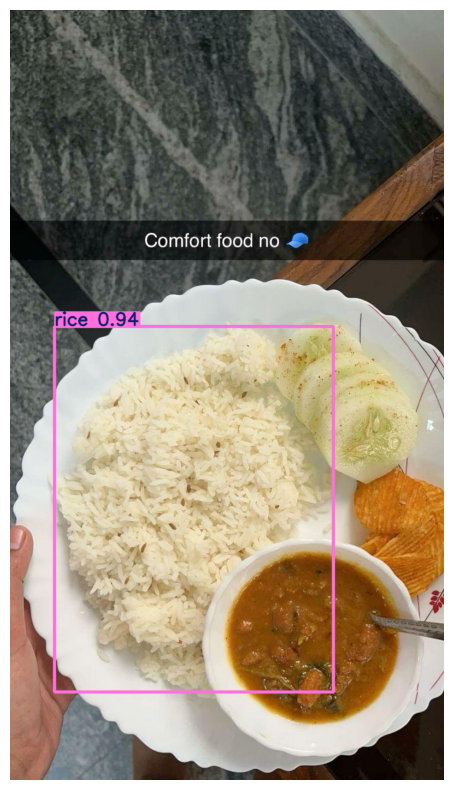

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load trained model
model = YOLO("/content/runs/detect/food_yolov8/weights/best.pt")

# Run inference on test images
results = model.predict(
    source="/content/drive/MyDrive/food_classification/food_detection/test/images",  # <-- updated path
    save=True,
    conf=0.5
)

# Show one sample result
sample_img = results[0].plot()
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()


Total detected images: 31


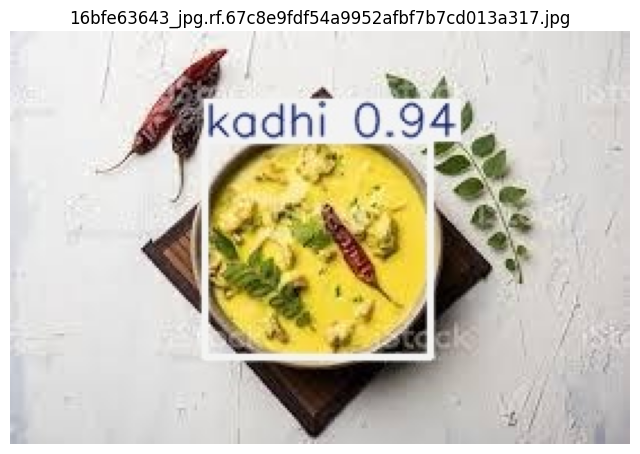

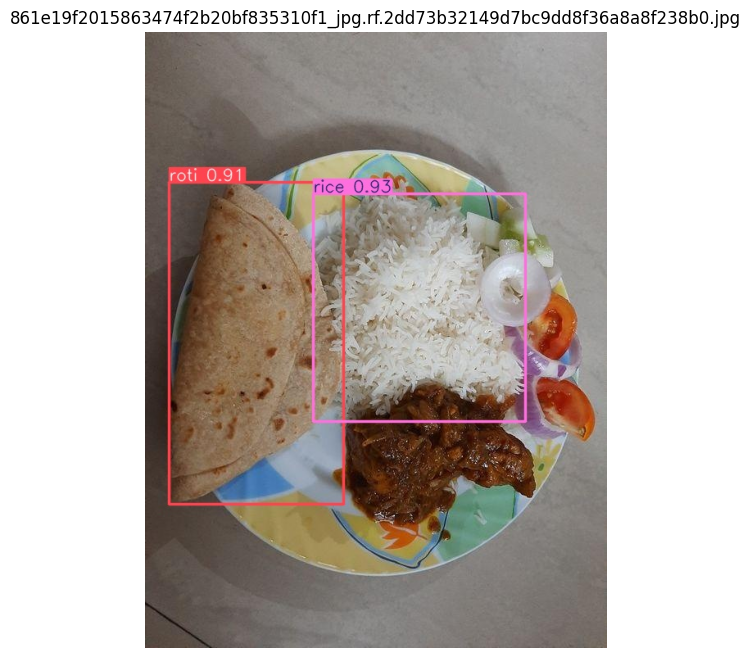

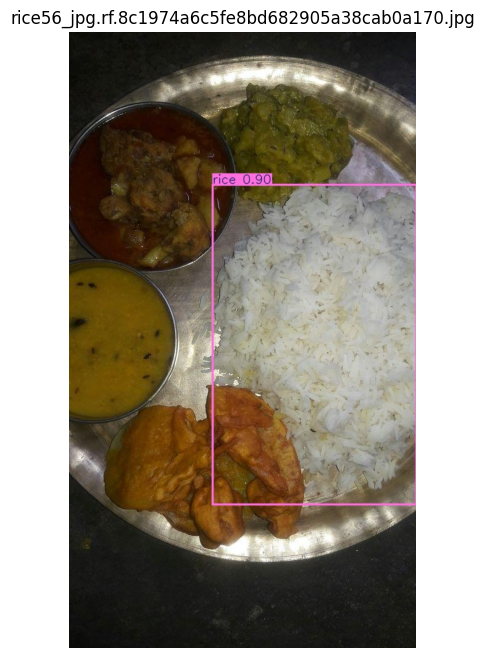

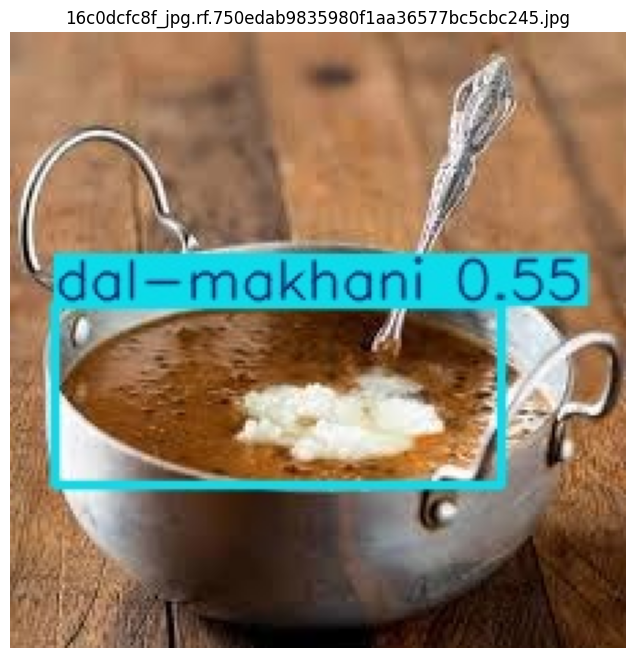

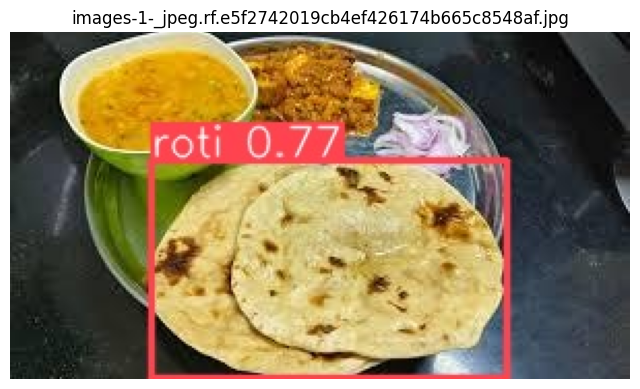

...

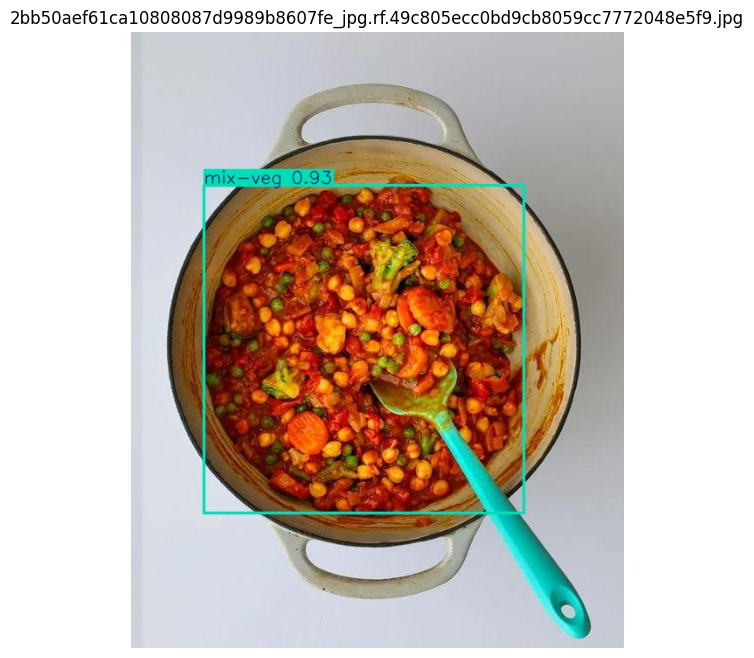

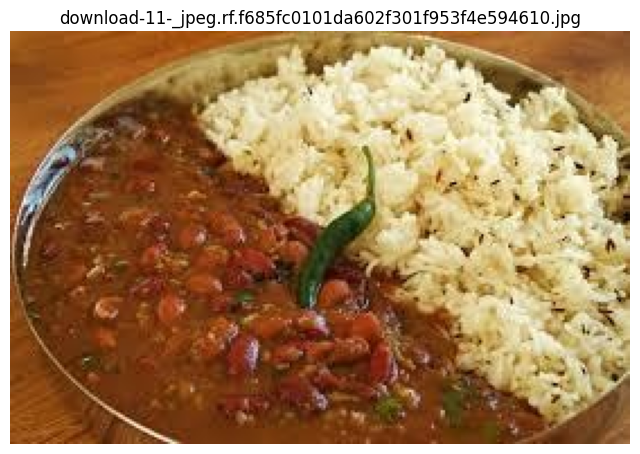

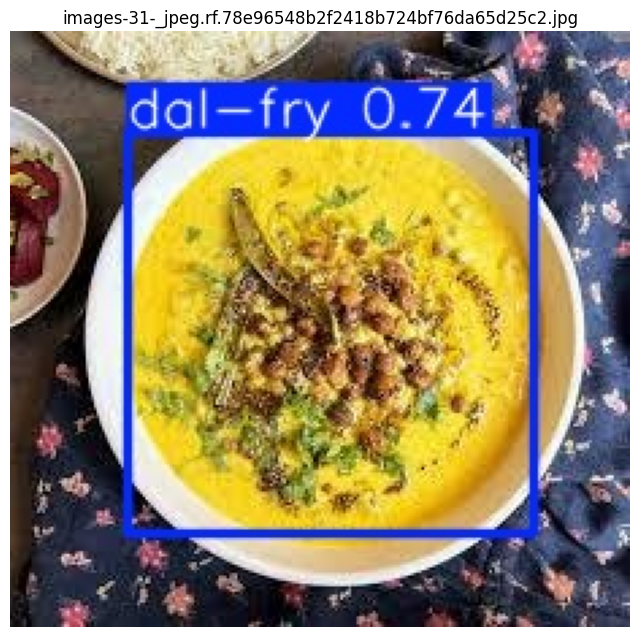

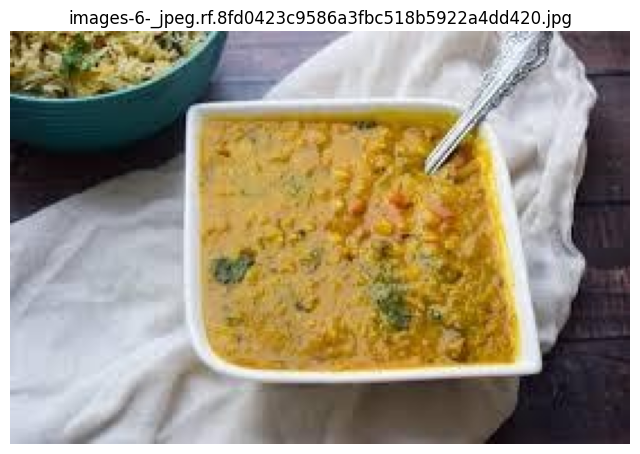

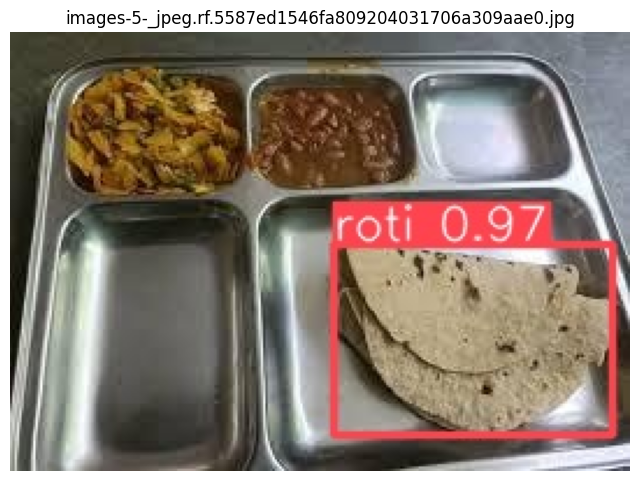

In [ ]:
import glob
import cv2
import matplotlib.pyplot as plt

# Path to YOLO results
result_imgs = glob.glob("/content/runs/detect/predict/*.jpg")

print(f"Total detected images: {len(result_imgs)}")

# Loop through all test results
for img_path in result_imgs:
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(8,8))
    plt.imshow(img)
    plt.title(img_path.split("/")[-1])  # show filename
    plt.axis("off")
    plt.show()
